# **Deep Convolutional GAN (DCGAN) implementation**

In [1]:
 ! pip install -q kaggle

In [46]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"pavelhym","key":"d51e996b6446b0c4d3bb97fb067a3dfd"}'}

In [3]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d jessicali9530/stanford-cars-dataset

100% 1.82G/1.82G [00:17<00:00, 126MB/s]
100% 1.82G/1.82G [00:17<00:00, 110MB/s]


In [4]:
!unzip -q /content/stanford-cars-dataset.zip

In [5]:
import torch
import torch.nn as nn

if torch.cuda.is_available():
    print(torch.cuda.get_device_name())

Tesla T4


In [6]:
# Create input and output folders
!mkdir input
!mkdir outputs

In [7]:
class Generator(nn.Module):
    def __init__(self, nz):
        super(Generator, self).__init__()
        self.nz = nz
        self.main = nn.Sequential(

          nn.ConvTranspose2d(nz, 512, kernel_size=4, stride=1, padding=0, bias=False),
          nn.BatchNorm2d(512),
          nn.ReLU(True),

          nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
          nn.BatchNorm2d(256),
          nn.ReLU(True),

          nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
          nn.BatchNorm2d(128),
          nn.ReLU(True),

          nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
          nn.BatchNorm2d(64),
          nn.ReLU(True),

          nn.ConvTranspose2d(64, 3, kernel_size=4,stride=2, padding=1, bias=False),
          nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)

## **Discriminator**


In [8]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(

          nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
          nn.BatchNorm2d(64),
          nn.LeakyReLU(0.2, True),

          nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
          nn.BatchNorm2d(128),
          nn.LeakyReLU(0.2, True),

          nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
          nn.BatchNorm2d(256),
          nn.LeakyReLU(0.2, True),

          nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
          nn.BatchNorm2d(512),
          nn.LeakyReLU(0.2, True),

          nn.Conv2d(512, 1, kernel_size=4,stride=2, padding=0, bias=False),
          nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [9]:
from torchvision.utils import save_image


# set the computation device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def label_real(size):
    """
    Fucntion to create real labels (ones)
    """
    data = torch.ones(size, 1)
    return data.to(device)

def label_fake(size):
    """
    Fucntion to create fake labels (zeros)
    """
    data = torch.zeros(size, 1)
    return data.to(device)

def create_noise(sample_size, nz):
    """
    Fucntion to create noise
    """
    return torch.randn(sample_size, nz, 1, 1).to(device)

def save_generator_image(image, path):
    """
    Function to save torch image batches
    """
    save_image(image, path, normalize=True)

def weights_init(m):

    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [10]:
import torchvision.transforms as transforms
import torch.optim as optim
import torchvision.datasets as datasets
from torch.utils.data import DataLoader

import numpy as np
import matplotlib
from matplotlib import pyplot as plt

from tqdm import tqdm

In [31]:
matplotlib.style.use('ggplot')

# learning parameters
image_size = 64
batch_size = 128
nz = 100

lr = 0.0002
sample_size = 64
epochs = 40 # number of epoch

# set the computation device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


In [13]:
"""Get data and normalize it"""
from torchvision.datasets import ImageFolder

mean = torch.tensor([0.5, 0.5, 0.5])
std = torch.tensor([0.5, 0.5, 0.5])
unnormalize = transforms.Normalize((-mean / std).tolist(), (1.0 / std).tolist())


transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean,
    std),
])

train_data = ImageFolder(
    root='/content/cars_train',
    transform=transform
)


data_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)


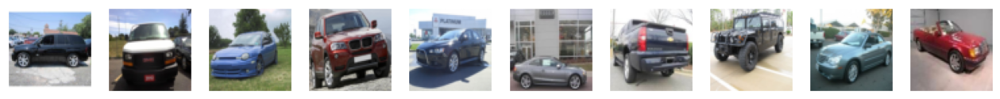

In [24]:
it = iter(data_loader)
first_batch = next(it)[0]

unnormalized = unnormalize(first_batch).cpu().detach().numpy()
fig = plt.figure(figsize=(16, 16))
columns = 10
rows = 1
for i in range(1, columns*rows +1):

    fig.add_subplot(rows, columns, i)
    plt.imshow(np.transpose(unnormalized[i-1], (1, 2, 0)))
    plt.gca().xaxis.set_visible(False)
    plt.gca().yaxis.set_ticks([])

plt.show()


In [25]:
# initialize generator and discriminator models
generator = Generator(nz).to(device)
discriminator = Discriminator().to(device)

# initialize generator and discriminator weights
generator.apply(weights_init)
discriminator.apply(weights_init)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2, inplace=True)
    (9): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.2, inplace=True)
    (12): Conv2d(512, 1, kernel_size=(

In [26]:
# optimizers for generator and discriminator
optim_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
optim_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

# loss function
criterion = nn.BCELoss()

losses_g = [] # to store generator loss after each epoch
losses_d = [] # to store discriminator loss after each epoch

In [27]:
# function to train the discriminator network
def train_discriminator(optimizer, data_real, data_fake):
    b_size = data_real.size(0)
    # get the real label vector
    real_label = label_real(b_size)
    # get the fake label vector
    fake_label = label_fake(b_size)

    optimizer.zero_grad()

    # get the outputs by doing real data forward pass
    output_real = discriminator(data_real)
    loss_real = criterion(torch.flatten(output_real, start_dim = 1), real_label)

    # get the outputs by doing fake data forward pass
    output_fake = discriminator(data_fake)
    loss_fake = criterion(torch.flatten(output_fake, start_dim = 1), fake_label)

    # compute gradients of real loss
    loss_real.backward()
    # compute gradients of fake loss
    loss_fake.backward()
    # update discriminator parameters
    optimizer.step()

    return loss_real + loss_fake

In [28]:
# function to train the generator network
def train_generator(optimizer, data_fake):
    b_size = data_fake.size(0)
    # get the real label vector
    real_label = label_real(b_size)

    optimizer.zero_grad()

    # output by doing a forward pass of the fake data through discriminator
    output = discriminator(data_fake)
    loss = criterion(torch.flatten(output, start_dim = 1), real_label)

    # compute gradients of loss
    loss.backward()
    # update generator parameters
    optimizer.step()

    return loss

In [29]:
def show_epoch_gen_imgs(generated_img, num, epoch):
  unnormalized = unnormalize(generated_img).cpu().detach().numpy()
  fig = plt.figure(figsize=(8, 8))
  columns = num
  rows = 1
  for i in range(1, columns*rows +1):

      fig.add_subplot(rows, columns, i)
      plt.imshow(np.transpose(unnormalized[i-1], (1, 2, 0)))
      plt.gca().xaxis.set_visible(False)
      plt.gca().yaxis.set_ticks([])
      if i ==1:
        plt.ylabel('epoch {}'.format(epoch),
            verticalalignment='center',
            horizontalalignment='right',
            rotation=0,
            fontsize=16)
  plt.show()

64it [00:57,  1.11it/s]


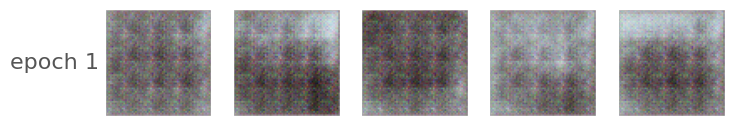

Epoch 1 of 40
Generator loss: 6.08481121, Discriminator loss: 0.65969515


64it [00:58,  1.10it/s]


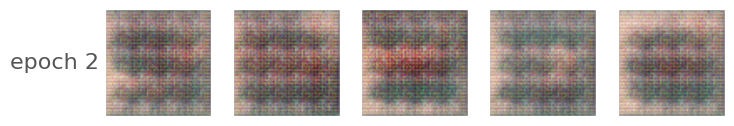

Epoch 2 of 40
Generator loss: 5.11895990, Discriminator loss: 0.54597551


64it [00:58,  1.10it/s]


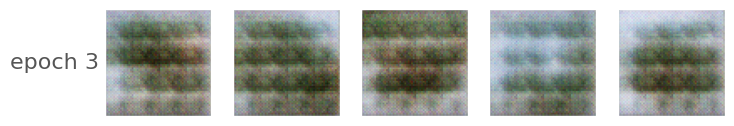

Epoch 3 of 40
Generator loss: 4.29674053, Discriminator loss: 0.76523048


64it [00:58,  1.10it/s]


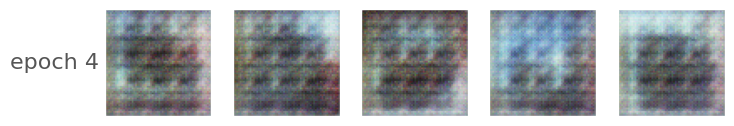

Epoch 4 of 40
Generator loss: 4.51677704, Discriminator loss: 0.60388190


64it [00:57,  1.10it/s]


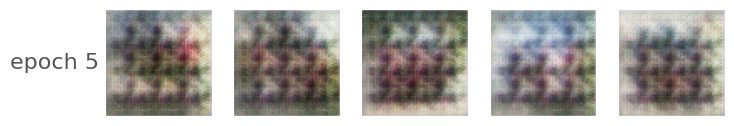

Epoch 5 of 40
Generator loss: 4.94500113, Discriminator loss: 0.50791734


64it [00:57,  1.11it/s]


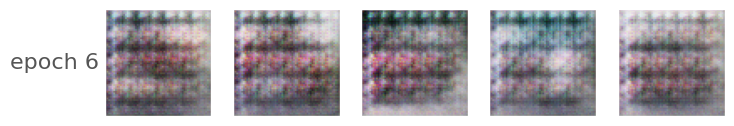

Epoch 6 of 40
Generator loss: 4.87516499, Discriminator loss: 0.47057098


64it [00:58,  1.10it/s]


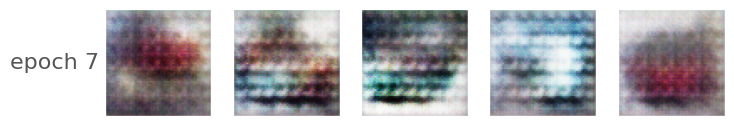

Epoch 7 of 40
Generator loss: 4.95578766, Discriminator loss: 0.42371041


64it [00:57,  1.11it/s]


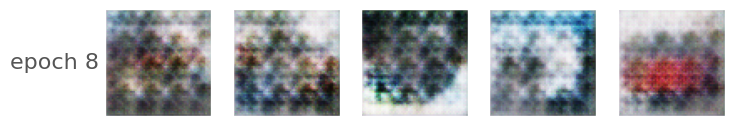

Epoch 8 of 40
Generator loss: 4.16614246, Discriminator loss: 0.49523216


64it [00:58,  1.10it/s]


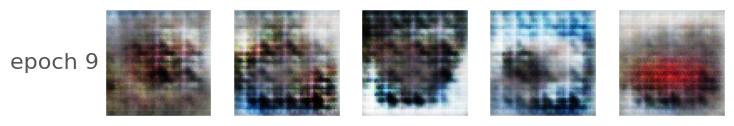

Epoch 9 of 40
Generator loss: 4.45794201, Discriminator loss: 0.40501255


64it [00:58,  1.10it/s]


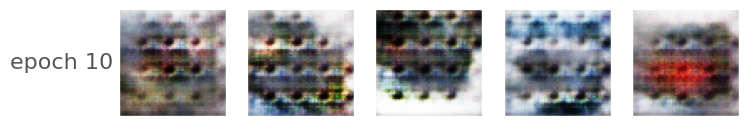

Epoch 10 of 40
Generator loss: 4.29949188, Discriminator loss: 0.46607754


64it [00:57,  1.10it/s]


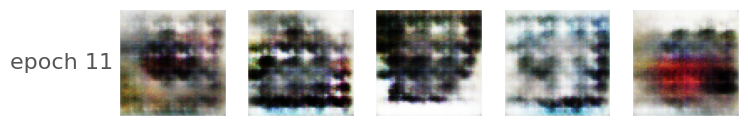

Epoch 11 of 40
Generator loss: 4.47045135, Discriminator loss: 0.64432633


64it [00:58,  1.09it/s]


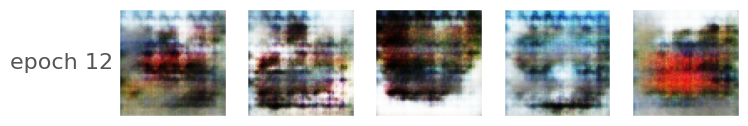

Epoch 12 of 40
Generator loss: 4.15750551, Discriminator loss: 0.54371941


64it [00:58,  1.10it/s]


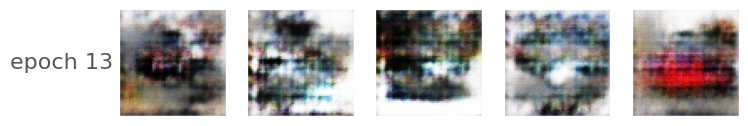

Epoch 13 of 40
Generator loss: 4.26902819, Discriminator loss: 0.62079787


64it [00:59,  1.07it/s]


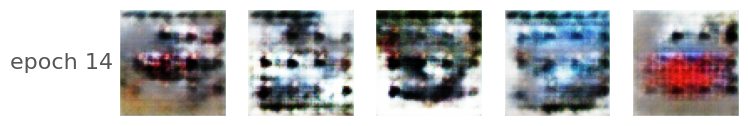

Epoch 14 of 40
Generator loss: 4.46326494, Discriminator loss: 0.62006557


64it [00:58,  1.09it/s]


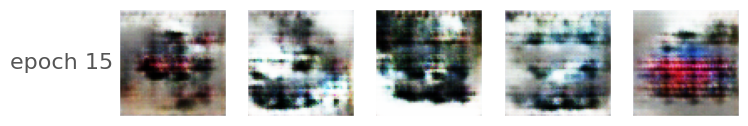

Epoch 15 of 40
Generator loss: 4.42305279, Discriminator loss: 0.64060032


64it [00:58,  1.09it/s]


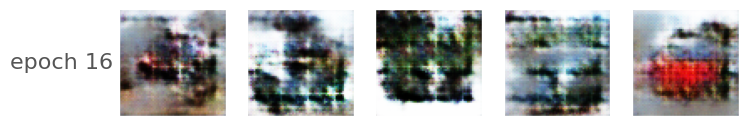

Epoch 16 of 40
Generator loss: 4.03639936, Discriminator loss: 0.42948195


64it [00:58,  1.09it/s]


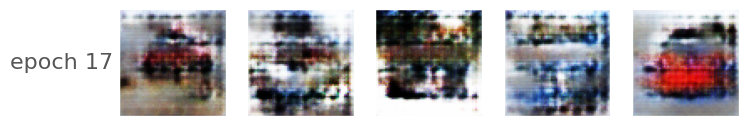

Epoch 17 of 40
Generator loss: 4.53489304, Discriminator loss: 0.51703840


64it [00:58,  1.10it/s]


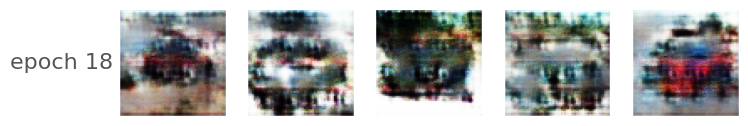

Epoch 18 of 40
Generator loss: 4.15486813, Discriminator loss: 0.42356271


64it [00:58,  1.10it/s]


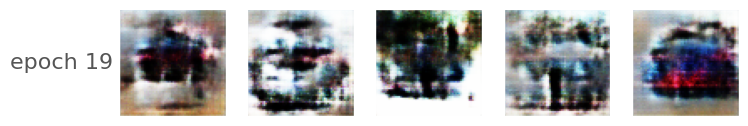

Epoch 19 of 40
Generator loss: 4.57309437, Discriminator loss: 0.55658478


64it [00:58,  1.09it/s]


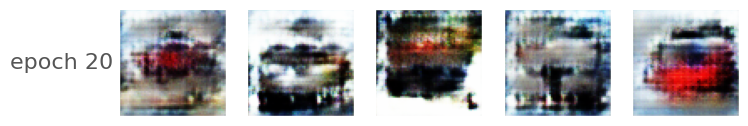

Epoch 20 of 40
Generator loss: 4.33543682, Discriminator loss: 0.30503303


64it [00:58,  1.09it/s]


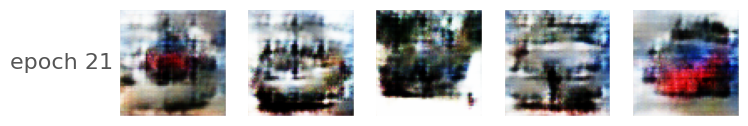

Epoch 21 of 40
Generator loss: 4.60546017, Discriminator loss: 0.51076376


64it [00:58,  1.09it/s]


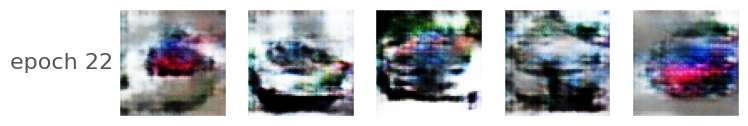

Epoch 22 of 40
Generator loss: 4.42815399, Discriminator loss: 0.35753623


64it [00:59,  1.08it/s]


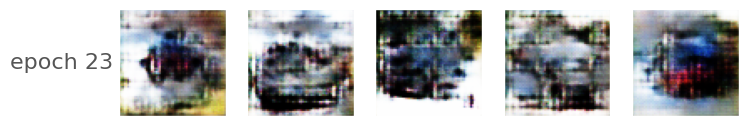

Epoch 23 of 40
Generator loss: 4.55939913, Discriminator loss: 0.59483379


64it [00:58,  1.09it/s]


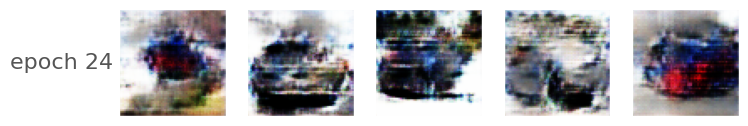

Epoch 24 of 40
Generator loss: 4.02585030, Discriminator loss: 0.39121932


64it [00:58,  1.09it/s]


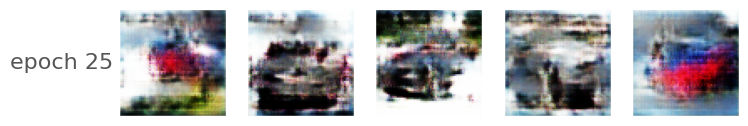

Epoch 25 of 40
Generator loss: 4.00625372, Discriminator loss: 0.58505327


64it [00:59,  1.08it/s]


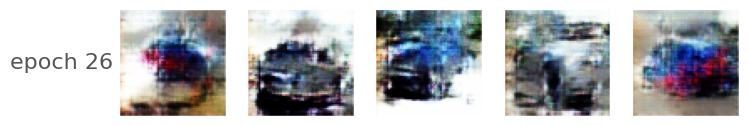

Epoch 26 of 40
Generator loss: 4.04827356, Discriminator loss: 0.46755710


64it [00:59,  1.08it/s]


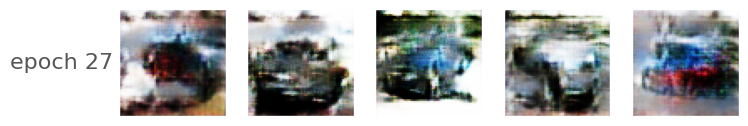

Epoch 27 of 40
Generator loss: 3.79716063, Discriminator loss: 0.59020925


64it [00:59,  1.07it/s]


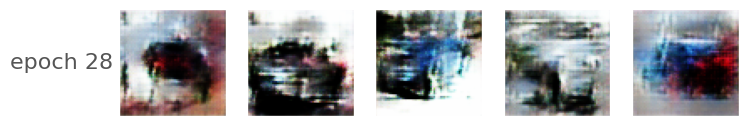

Epoch 28 of 40
Generator loss: 3.89364362, Discriminator loss: 0.55575228


64it [00:59,  1.08it/s]


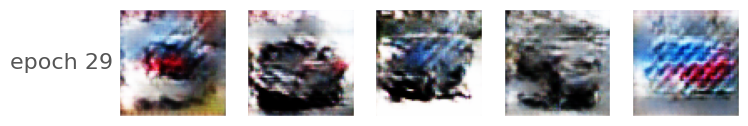

Epoch 29 of 40
Generator loss: 4.01585722, Discriminator loss: 0.47996220


64it [00:59,  1.08it/s]


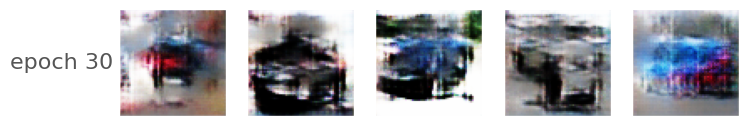

Epoch 30 of 40
Generator loss: 4.01137686, Discriminator loss: 0.47893482


64it [00:59,  1.07it/s]


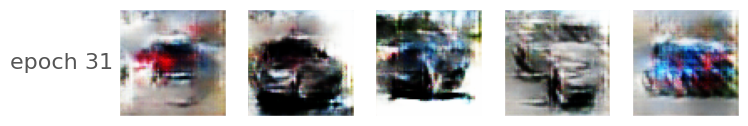

Epoch 31 of 40
Generator loss: 3.78804231, Discriminator loss: 0.37617952


64it [00:59,  1.07it/s]


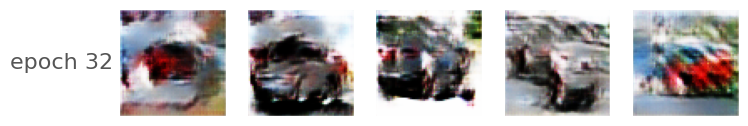

Epoch 32 of 40
Generator loss: 3.83824277, Discriminator loss: 0.64562839


64it [01:00,  1.06it/s]


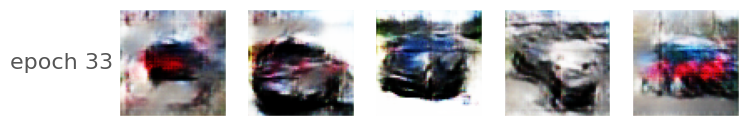

Epoch 33 of 40
Generator loss: 3.94144273, Discriminator loss: 0.53544629


64it [00:59,  1.07it/s]


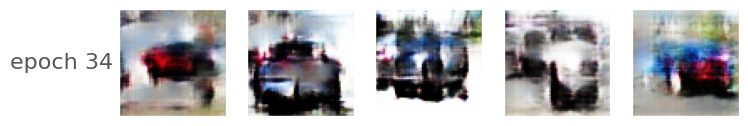

Epoch 34 of 40
Generator loss: 4.15756798, Discriminator loss: 0.53219497


64it [01:00,  1.07it/s]


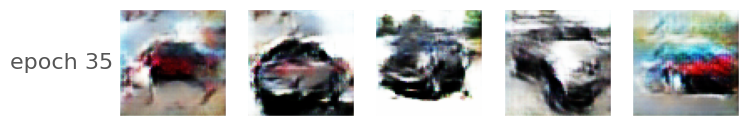

Epoch 35 of 40
Generator loss: 3.76267505, Discriminator loss: 0.47348619


64it [01:00,  1.07it/s]


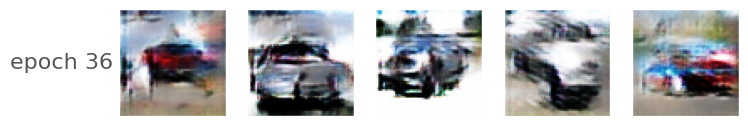

Epoch 36 of 40
Generator loss: 3.71905017, Discriminator loss: 0.34781331


64it [00:59,  1.07it/s]


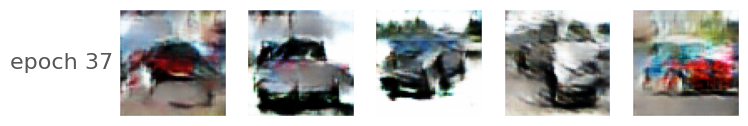

Epoch 37 of 40
Generator loss: 3.98970604, Discriminator loss: 0.74967909


64it [01:01,  1.04it/s]


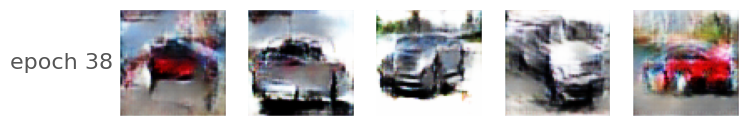

Epoch 38 of 40
Generator loss: 3.39578223, Discriminator loss: 0.34625736


64it [01:00,  1.06it/s]


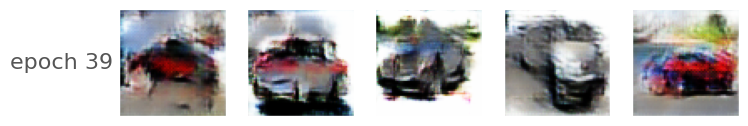

Epoch 39 of 40
Generator loss: 3.81853604, Discriminator loss: 0.77450198


64it [01:00,  1.06it/s]


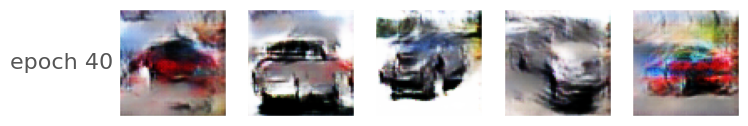

Epoch 40 of 40
Generator loss: 3.36901903, Discriminator loss: 0.45535406
DONE TRAINING


In [33]:
# create the noise vector
noise = torch.randn(64, 100, 1, 1).to(device)

images_epochs = []

generator.train()
discriminator.train()

for epoch in range(epochs):
    loss_g = 0.0
    loss_d = 0.0
    for bi, data in tqdm(enumerate(data_loader), total=int(len(data_loader)/data_loader.batch_size)):
        image, _ = data
        image = image.to(device)
        b_size = len(image)

        # forward pass through generator to create fake data

        data_fake = generator(torch.randn(b_size, 100, 1, 1).to(device)).detach()
        data_real = image

        loss_d += train_discriminator(optim_d, data_real, data_fake)
        data_fake = generator(torch.randn(b_size, 100, 1, 1).to(device))
        loss_g += train_generator(optim_g, data_fake)


    # final forward pass through generator to create fake data
    # after training for current epoch
    generated_img = generator(noise)
    images_epochs.append(generated_img)
    show_epoch_gen_imgs(generated_img, 5, epoch + 1)
    # save the generated torch tensor models to disk
    save_generator_image(generated_img, f"outputs/gen_img{epoch}.png")
    epoch_loss_g = loss_g / bi # total generator loss for the epoch
    epoch_loss_d = loss_d / bi # total discriminator loss for the epoch
    losses_g.append(epoch_loss_g)
    losses_d.append(epoch_loss_d)

    print(f"Epoch {epoch+1} of {epochs}")
    print(f"Generator loss: {epoch_loss_g:.8f}, Discriminator loss: {epoch_loss_d:.8f}")

print('DONE TRAINING')
# save the model weights to disk
torch.save(generator.state_dict(), 'outputs/generator.pth')

In [34]:
# Convert losses variables into numpy arrays for visualization
losses_g_array = [x.item() for x in losses_g]
losses_d_array = [x.item() for x in losses_d]

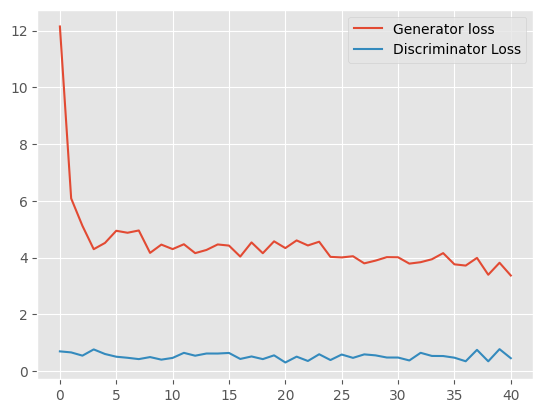

In [35]:
# plot and save the generator and discriminator loss
plt.figure()
plt.plot(losses_g_array, label='Generator loss')
plt.plot(losses_d_array, label='Discriminator Loss')
plt.legend()
plt.savefig('outputs/loss.png')
plt.show()

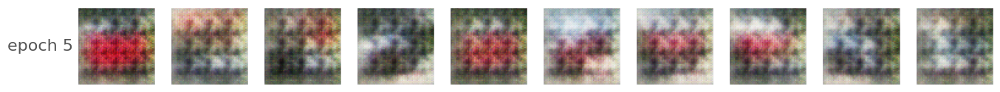

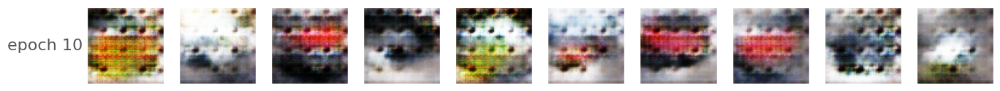

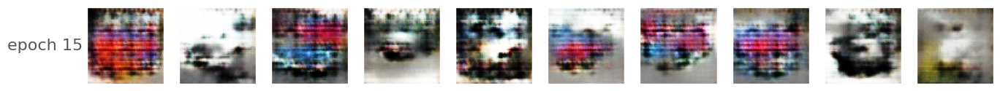

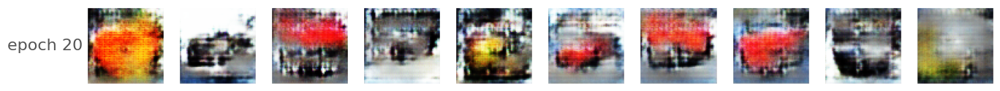

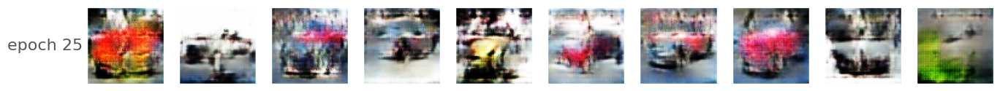

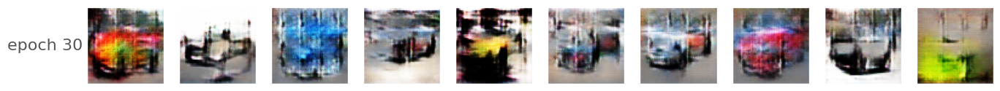

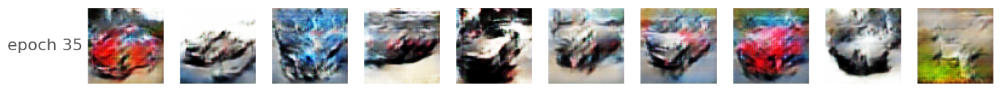

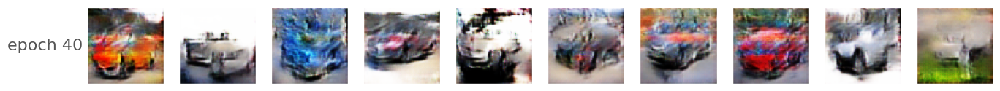

In [60]:
  for epoch, images in enumerate(images_epochs):
    if (epoch + 1)  % 5 != 0:
      continue
    unnormalized = unnormalize(images).cpu().detach().numpy()
    fig = plt.figure(figsize=(16, 16))
    columns = 10
    rows = 1
    for i in range(1, columns*rows +1):

        fig.add_subplot(rows, columns, i)
        plt.imshow(np.transpose(unnormalized[10 + i], (1, 2, 0)))
        plt.gca().xaxis.set_visible(False)
        plt.gca().yaxis.set_ticks([])
        if i ==1:
          plt.ylabel('epoch {}'.format(epoch + 1),
              verticalalignment='center',
              horizontalalignment='right',
              rotation=0,
              fontsize=16)

# Super resolution

In [37]:
!pip install -q super-image



In [39]:
unnormalized_generated = unnormalize(generated_img)

In [41]:
from super_image import EdsrModel, ImageLoader

model = EdsrModel.from_pretrained('eugenesiow/edsr-base', scale=2)      # scale 2, 3 and 4 models available
preds = model(unnormalized_generated)

https://huggingface.co/eugenesiow/edsr-base/resolve/main/pytorch_model_2x.pt


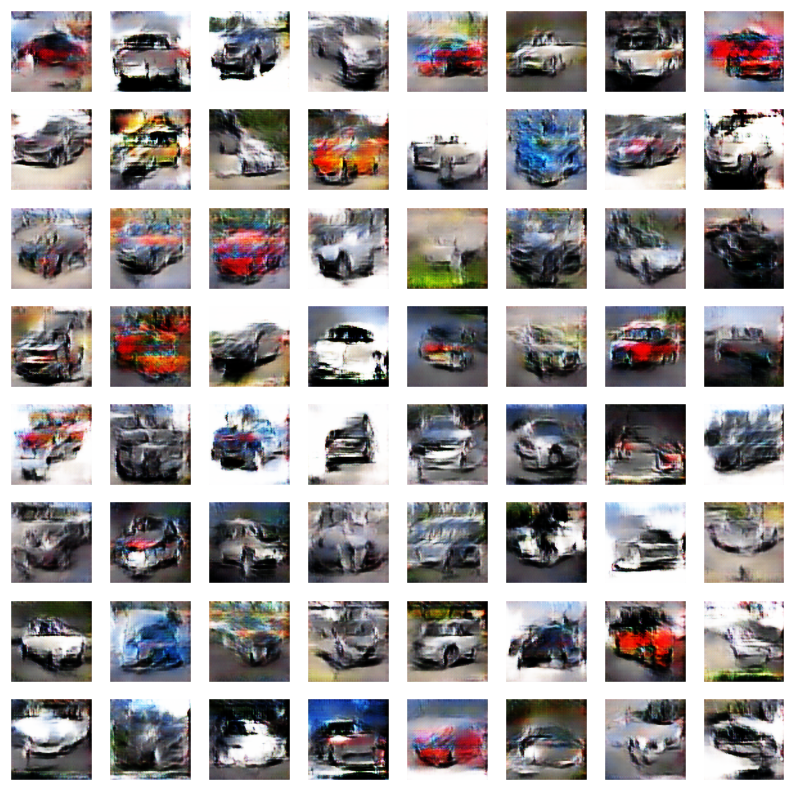

In [53]:

  fig = plt.figure(figsize=(10, 10))
  columns = 8
  rows = 8
  for i in range(1, columns*rows +1):

      fig.add_subplot(rows, columns, i)
      plt.imshow(np.clip(np.transpose(preds.cpu().detach().numpy()[i-1], (1, 2, 0)),0,1))
      plt.gca().xaxis.set_visible(False)
      plt.gca().yaxis.set_ticks([])

  plt.show()